In [2]:
!pip install pylatexenc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pylatexenc: filename=pylatexenc-2.10-py3-none-any.whl size=136817 sha256=a878815773a29db9a0d8f6effca27c5595be542eae02177992bcb41e860c0001
  Stored in directory: /root/.cache/pip/wheels/06/3e/78/fa1588c1ae991bbfd814af2bcac6cef7a178beee1939180d46
Successfully built pylatexenc


In [3]:
!pip install qiskit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 69.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 82.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.5 MB/s eta 0:00:00


#Criando Registradores

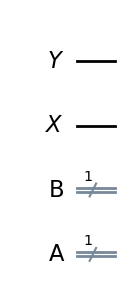

In [4]:
from qiskit import (
    QuantumCircuit,
    QuantumRegister,
    ClassicalRegister
)

x = QuantumRegister(1, "X")
y = QuantumRegister(1, "Y")
a = ClassicalRegister(1, "A")
b = ClassicalRegister(1, "B")

qc = QuantumCircuit(y, x, b, a)

display(qc.draw("mpl"))

#Aplicando portas lógicas a circuitos

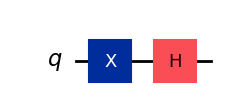

<IPython.core.display.Latex object>

In [6]:
from qiskit import QuantumCircuit
from qiskit.quantum_info import Statevector

qc = QuantumCircuit(1)
qc.x(0)
qc.h(0)

display(qc.draw("mpl"))
display(Statevector.from_instruction(qc).draw("latex"))

#Circuito com Medidores

 - Aqui estamos criando um circuito com dois qbits
 - Adicionando a porta .x no primeiro qbit
 - Adicionando a porta .h em ambos os qbits
 - Usando .measure_all para medir ambos ao mesmo tempo e já apontar para um registrador clássico (clbit)

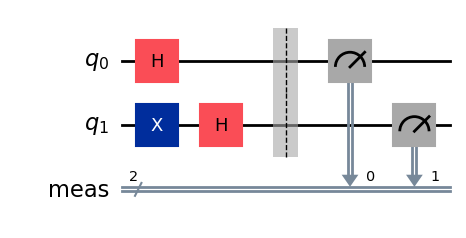

In [7]:
qc = QuantumCircuit(2)
qc.x(1)
qc.h([0,1])
qc.measure_all()
display(qc.draw("mpl"))

#Simulando a medição de um circuito

In [8]:
!pip install qiskit-aer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 79.3 MB/s eta 0:00:00


Existem dois métodos primitivos para medir um circuito
- Sampler (Medições em forma de amostras)
- Estimator (Estimar as probabilidades de medição)

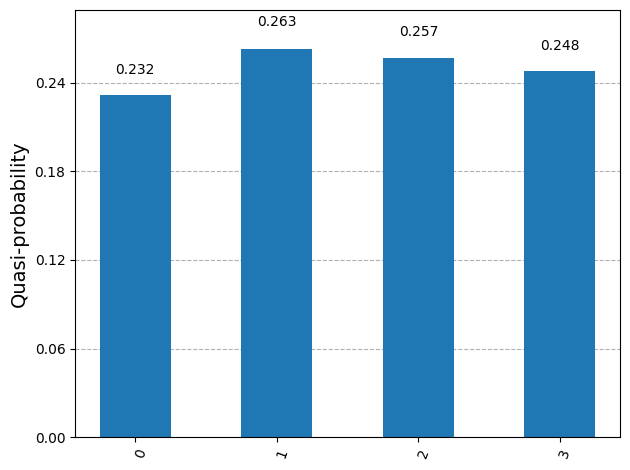

In [9]:
from qiskit_aer.primitives import Sampler
from qiskit.visualization import plot_histogram

job = Sampler().run(qc, shots=1000)
result = job.result().quasi_dists[0]

plot_histogram(result)

#Esfera de Bloch em Circuitos

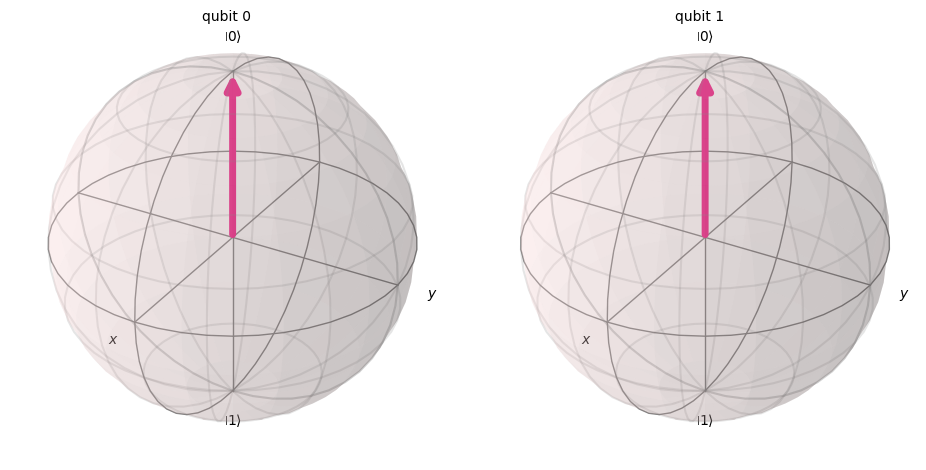

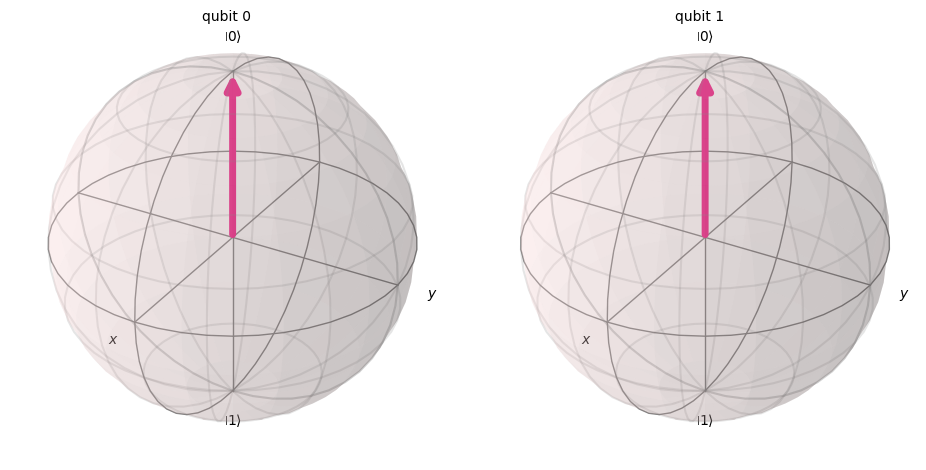

/tmp/ipykernel_5659/540764761.py:15: DeprecationWarning: The function ``qiskit.visualization.transition_visualization.visualize_transition()`` is deprecated as of Qiskit 1.2.0. It will be removed in the 2.0 release.
  visualize_transition(qc_1)


In [10]:
import numpy as np
from qiskit.visualization import (
    plot_bloch_multivector,
    visualize_transition
)

qc_0 = QuantumCircuit(2)
qc.x(1)
display(plot_bloch_multivector(qc_0))
qc.h([0,1])
display(plot_bloch_multivector(qc_0))

qc_1 = QuantumCircuit(1)
qc_1.rx(np.pi, 0)
visualize_transition(qc_1)